# Color Palette ControlNet Inference & Ablation Study

**Model:** `5unnySunny/color-controlnet-v1` (trained on ArtCap with 5-color palettes)  
**Base:** Stable Diffusion v1.5  
**Purpose:**  
- Load and run inference with your trained ControlNet  
- Perform systematic ablations to understand model behavior  
- Evaluate qualitative and quantitative performance

This notebook contains **10 code cells** demonstrating:
- Model loading  
- Single generations  
- Ablations (conditioning scale, prompt influence, CFG, noise robustness)  
- Qualitative success/failure cases  
- Quantitative palette adherence metric

In [12]:
# ==========================================================
# CELL 1: Load the Trained ControlNet + Pipeline
# ==========================================================
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from PIL import Image
import torch
import numpy as np

# Your trained model on Hugging Face
MODEL_ID = "5unnySunny/color-controlnet-v1"
BASE_MODEL = "runwayml/stable-diffusion-v1-5"

# Load ControlNet in half-precision for speed & memory efficiency
controlnet = ControlNetModel.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    use_safetensors=True,
    # variant="fp16"  # Uncomment if you uploaded fp16 variant
)
print("⏳ Loading Stable Diffusion Pipeline...")

# Load full pipeline with ControlNet attached
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    BASE_MODEL,
    controlnet=controlnet,
    torch_dtype=torch.float16,
    safety_checker=None  # Disable for faster inference (art generation)
)

# Move to GPU
pipe = pipe.to("cuda")

# Enable memory-efficient attention (uncomment if xformers is installed)
# pipe.enable_xformers_memory_efficient_attention()

print("✅ Model loaded successfully!")

⏳ Loading Stable Diffusion Pipeline...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


### Example 1: Generation with Descriptive Prompt

  0%|          | 0/30 [00:00<?, ?it/s]

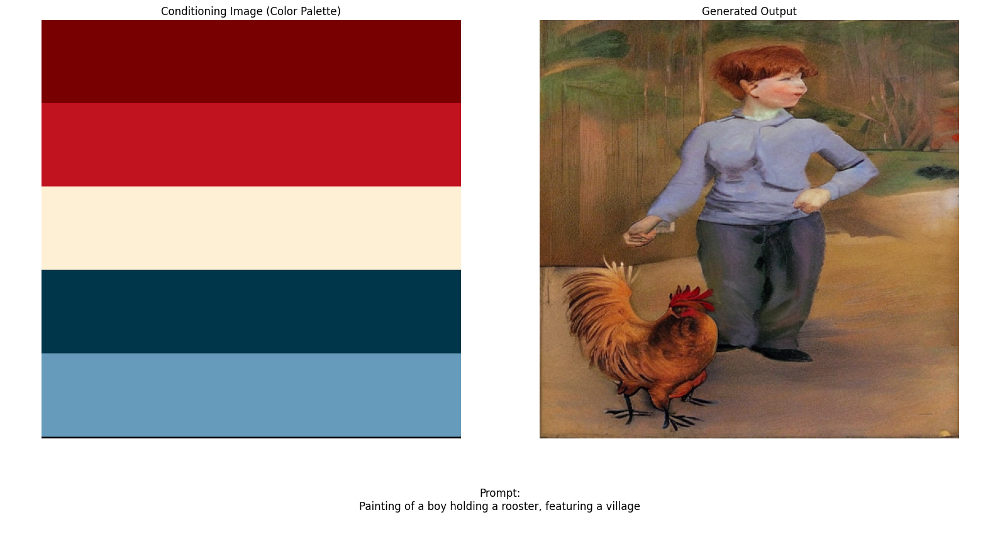

Saved combined result to: palette_controlnet_result_with_prompt_2.png


In [27]:
# ==========================================================
# CELL 2: Generate with Descriptive Prompt + Visualization
# ==========================================================
import matplotlib.pyplot as plt
from textwrap import fill
from PIL import Image

# Load conditioning palette
conditioning_image = Image.open("/kaggle/input/color-palettes/Fiery_Ocean.png") \
    .convert("RGB").resize((512, 512))

prompt = "Painting of a boy holding a rooster, featuring a village"

# Generate
image = pipe(
    prompt,
    image=conditioning_image,
    num_inference_steps=30,
    controlnet_conditioning_scale=2.0,
    guidance_scale=3.5,
    guess_mode=True,
).images[0]

# Optional: save single image
image.save("generated_color_example.png")

# -------------------------------
# Combined visualization
# -------------------------------
fig = plt.figure(figsize=(16, 9))
gs = fig.add_gridspec(2, 2, height_ratios=[1, 0.25])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax_text = fig.add_subplot(gs[1, :])

ax1.imshow(conditioning_image)
ax1.set_title("Conditioning Image (Color Palette)", fontsize=12)
ax1.axis("off")

ax2.imshow(image)
ax2.set_title("Generated Output", fontsize=12)
ax2.axis("off")

wrapped_prompt = fill(prompt, width=90)
ax_text.text(0.5, 0.5, f"Prompt:\n{wrapped_prompt}", ha="center", va="center", fontsize=12)
ax_text.axis("off")

plt.tight_layout()
OUT_FIG = "palette_controlnet_result_with_prompt_2.png"
plt.savefig(OUT_FIG, dpi=200, bbox_inches="tight")
plt.show()
print(f"Saved combined result to: {OUT_FIG}")

### Example 2: Generation with Minimal Prompt

  0%|          | 0/40 [00:00<?, ?it/s]

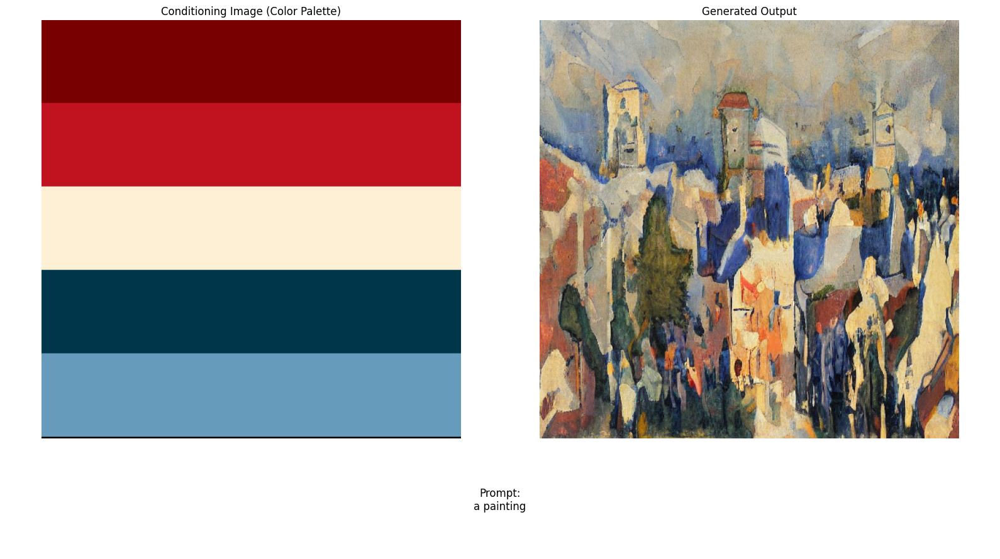

Saved combined result to: palette_controlnet_result_with_prompt_1.png


In [24]:
# ==========================================================
# CELL 3: Generate with Minimal Prompt + Visualization
# ==========================================================
import matplotlib.pyplot as plt
from textwrap import fill
from PIL import Image

# Same conditioning image
conditioning_image = Image.open("/kaggle/input/color-palettes/Fiery_Ocean.png") \
    .convert("RGB").resize((512, 512))

prompt = "a painting"

image = pipe(
    prompt,
    image=conditioning_image,
    num_inference_steps=40,
    controlnet_conditioning_scale=2.0,
    guidance_scale=3.5,
    guess_mode=False,
).images[0]

image.save("generated_color_example_2.png")

# Visualization
fig = plt.figure(figsize=(16, 9))
gs = fig.add_gridspec(2, 2, height_ratios=[1, 0.25])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax_text = fig.add_subplot(gs[1, :])

ax1.imshow(conditioning_image)
ax1.set_title("Conditioning Image (Color Palette)", fontsize=12)
ax1.axis("off")

ax2.imshow(image)
ax2.set_title("Generated Output", fontsize=12)
ax2.axis("off")

wrapped_prompt = fill(prompt, width=90)
ax_text.text(0.5, 0.5, f"Prompt:\n{wrapped_prompt}", ha="center", va="center", fontsize=12)
ax_text.axis("off")

plt.tight_layout()
OUT_FIG = "palette_controlnet_result_with_prompt_1.png"
plt.savefig(OUT_FIG, dpi=200, bbox_inches="tight")
plt.show()
print(f"Saved combined result to: {OUT_FIG}")

### Inference & Visualization Helpers

In [14]:
# ==========================================================
# CELL 4: Inference & Visualization Helper Functions
# ==========================================================
import matplotlib.pyplot as plt
from textwrap import fill
import torch
import numpy as np

# 1. Inference wrapper
def run_inference(prompt, cond_img, scale=3.0, cfg=7.5, steps=40, guess_mode=False):
    """Runs ControlNet inference with given parameters."""
    return pipe(
        prompt,
        image=cond_img,
        num_inference_steps=steps,
        controlnet_conditioning_scale=scale,
        guidance_scale=cfg,
        guess_mode=guess_mode
    ).images[0]

# 2. Grid visualization
def display_grid(images, titles, rows=1, cols=None, figsize=(15, 6), main_title="", save_path=None):
    """Displays images in a grid with titles and optional save."""
    if cols is None: cols = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if rows * cols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    
    for idx, (img, title) in enumerate(zip(images, titles)):
        if idx < len(axes):
            axes[idx].imshow(img)
            axes[idx].set_title(fill(title, width=20), fontsize=10)
            axes[idx].axis("off")
    
    if main_title:
        plt.suptitle(main_title, fontsize=16)
    
    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches="tight")
        print(f"✅ Saved figure to: {save_path}")
    
    plt.tight_layout()
    plt.show()

# Load conditioning image (used in all ablations)
conditioning_image = Image.open("/kaggle/input/color-palettes/Fiery_Ocean.png") \
    .convert("RGB").resize((512, 512))

base_prompt = "Painting of a boy holding a rooster, featuring a village"

### Ablation A: Varying Conditioning Scale

Running Ablation A: Conditioning Scale...


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

✅ Saved figure to: ablation_scale.png


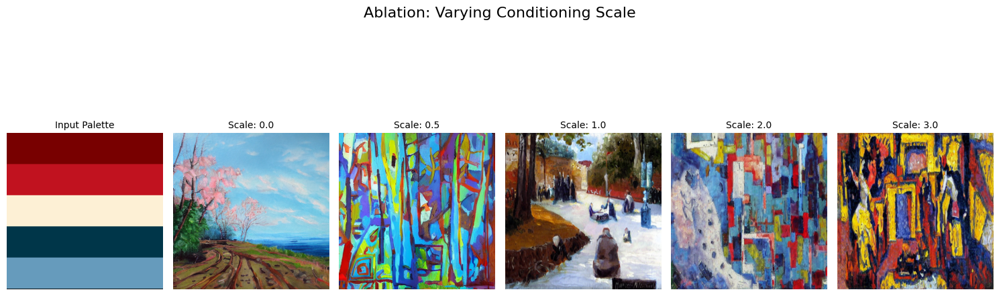

In [15]:
# ==========================================================
# CELL 5: Ablation A – Conditioning Scale (0.0 to 3.0)
# ==========================================================
prompt1 = "a painting"
scales = [0.0, 0.5, 1.0, 2.0, 3.0]

images_a = [conditioning_image]
titles_a = ["Input Palette"]

print("Running Ablation A: Conditioning Scale...")
for scale in scales:
    output = run_inference(prompt=prompt1, cond_img=conditioning_image, scale=scale)
    images_a.append(output)
    titles_a.append(f"Scale: {scale}")

display_grid(
    images_a,
    titles_a,
    main_title="Ablation: Varying Conditioning Scale",
    save_path="ablation_scale.png"
)

### Ablation B: Prompt Influence (Detailed vs Generic vs Empty)

Running Ablation B: Prompt Influence...


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

✅ Saved figure to: ablation_prompt.png


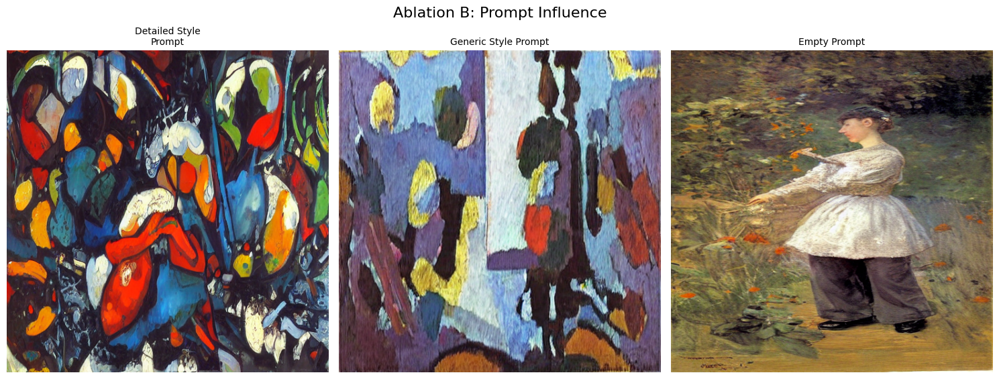

In [16]:
# ==========================================================
# CELL 6: Ablation B – Prompt Influence
# ==========================================================
prompts = [
    "A detailed expressive painting with visible brush strokes and harmonious color composition",
    "A painting",
    ""
]

titles_b = [
    "Detailed Style Prompt",
    "Generic Style Prompt",
    "Empty Prompt"
]

images_b = []
print("Running Ablation B: Prompt Influence...")
for text in prompts:
    is_guess = (text == "")
    output = run_inference(
        prompt=text,
        cond_img=conditioning_image,
        scale=2.0,
        cfg=5.0,
        steps=40,
        guess_mode=is_guess
    )
    images_b.append(output)

display_grid(
    images_b,
    titles_b,
    main_title="Ablation B: Prompt Influence",
    save_path="ablation_prompt.png"
)

### Ablation C: Guidance Scale (CFG)

Running Ablation C: Guidance Scale (CFG)...


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

✅ Saved figure to: ablation_cfg.png


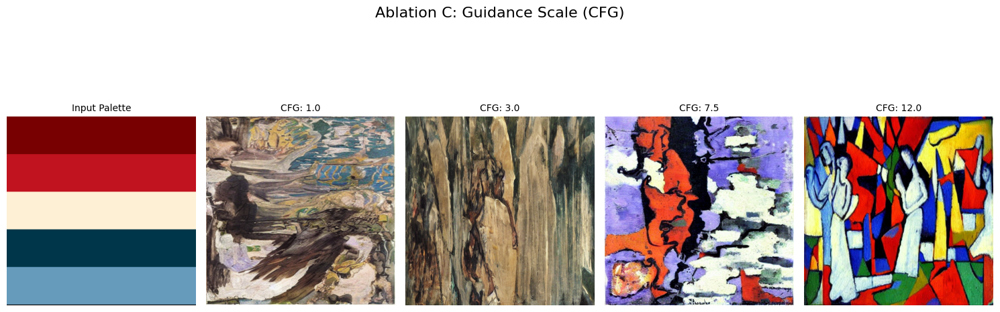

In [17]:
# ==========================================================
# CELL 7: Ablation C – Guidance Scale (CFG)
# ==========================================================
cfg_values = [1.0, 3.0, 7.5, 12.0]
images_c = [conditioning_image]
titles_c = ["Input Palette"]

print("Running Ablation C: Guidance Scale (CFG)...")
for cfg in cfg_values:
    output = run_inference(
        prompt="a painting",
        cond_img=conditioning_image,
        scale=2.0,
        cfg=cfg,
        steps=40,
        guess_mode=False
    )
    images_c.append(output)
    titles_c.append(f"CFG: {cfg}")

display_grid(
    images_c,
    titles_c,
    main_title="Ablation C: Guidance Scale (CFG)",
    save_path="ablation_cfg.png"
)

### Ablation D: Robustness to Noisy Conditioning Image

Running Ablation D: Noisy Conditioning Palette...


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

✅ Saved figure to: ablation_noise_condition.png


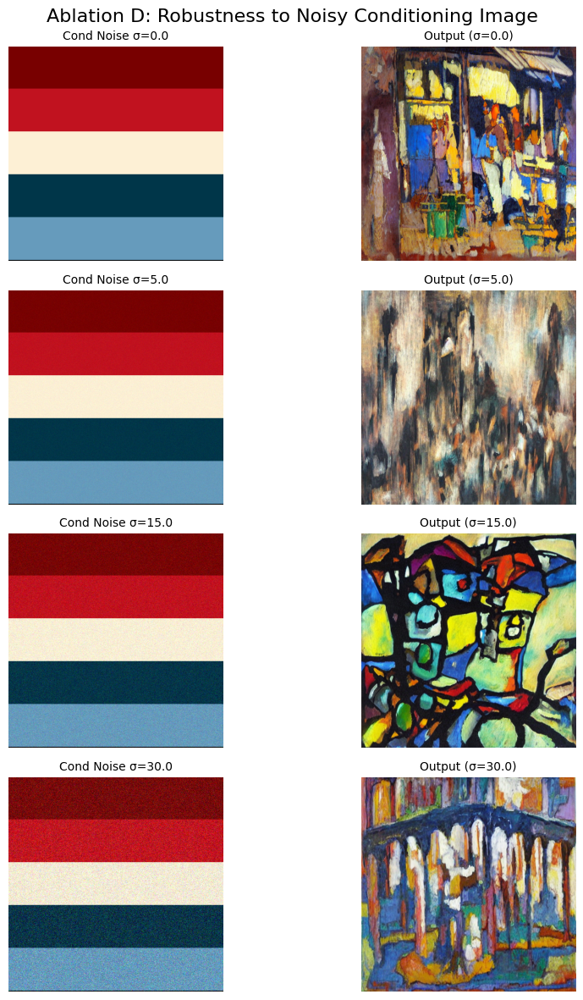

In [18]:
# ================================
# Ablation D: Noisy Conditioning Image
# ================================

import numpy as np
from PIL import Image

def add_palette_noise(pil_img, sigma=0.0):
    """
    Adds Gaussian noise to the conditioning image (palette) in pixel space.
    sigma is in [0..255] scale.
    """
    arr = np.array(pil_img).astype(np.float32)
    if sigma > 0:
        noise = np.random.normal(0, sigma, arr.shape).astype(np.float32)
        arr = arr + noise
    arr = np.clip(arr, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

# Noise levels to test (tuned for visible effect)
sigmas = [0.0, 5.0, 15.0, 30.0]  # clean -> mild -> medium -> strong noise

images_d = []
titles_d = []

print("Running Ablation D: Noisy Conditioning Palette...")

for s in sigmas:
    noisy_cond = add_palette_noise(conditioning_image, sigma=s)

    # Run inference with fixed settings
    output = run_inference(
        prompt="a painting",
        cond_img=noisy_cond,
        scale=2.0,
        cfg=5.0,
        steps=40,
        guess_mode=False
    )

    images_d.append(noisy_cond)
    images_d.append(output)
    titles_d.append(f"Cond Noise σ={s}")
    titles_d.append(f"Output (σ={s})")

# Visualize as pairs: (condition, output)
display_grid(
    images_d,
    titles_d,
    rows=len(sigmas),
    cols=2,
    figsize=(10, 3 * len(sigmas)),
    main_title="Ablation D: Robustness to Noisy Conditioning Image",
    save_path="ablation_noise_condition.png"
)


### Qualitative Evaluation: Success vs. Failure

Generating Qualitative Comparison...


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ Saved figure to: qualitative_analysis.png


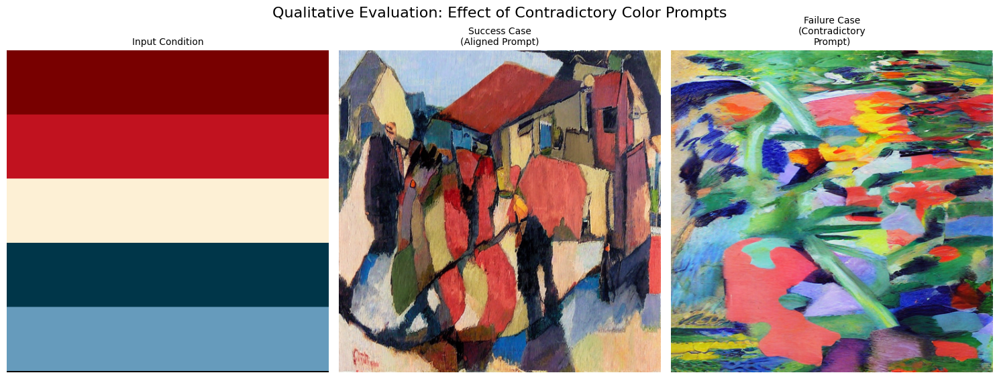

In [46]:
# ==========================================================
# CELL 9: Qualitative Evaluation – Success vs Failure
# ==========================================================
# 1. Success Case: Prompt aligns with the conditioning colors
success_prompt = (
    "A warm expressive painting with rich red, earthy tones, "
    "painterly brush strokes, and harmonious color composition"
)

# 2. Failure Case: Prompt contradicts the conditioning colors
# We force a "Snowy" scene on a "Fiery" palette.
# If the model outputs red snow, it shows ControlNet is dominating (which is good analysis).
failure_prompt = (
    "A vivid painting dominated by bright green and pink tones, "
    "cool neon colors, and high contrast color blocks"
)

print("Generating Qualitative Comparison...")
# Generate images
img_success = run_inference(success_prompt, conditioning_image, scale=2.0)
img_failure = run_inference(failure_prompt, conditioning_image, scale=2.0)

# Display grid
# We reuse your helper, but pass specific titles for the report
qualitative_imgs = [conditioning_image, img_success, img_failure]
qualitative_titles = ["Input Condition", "Success Case (Aligned Prompt)", "Failure Case (Contradictory Prompt)"]
display_grid(
    qualitative_imgs,
    qualitative_titles,
    main_title="Qualitative Evaluation: Effect of Contradictory Color Prompts",
    save_path="qualitative_analysis.png"
)

### Quantitative Evaluation: Palette Adherence Metric

Running Prompt Influence Evaluation...



  0%|          | 0/40 [00:00<?, ?it/s]

Artistic Prompt:
 Palette Adherence Score: 0.4485



  0%|          | 0/40 [00:00<?, ?it/s]

Descriptive Prompt:
 Palette Adherence Score: 0.4352



  0%|          | 0/10 [00:00<?, ?it/s]

Empty Prompt:
 Palette Adherence Score: 0.4708



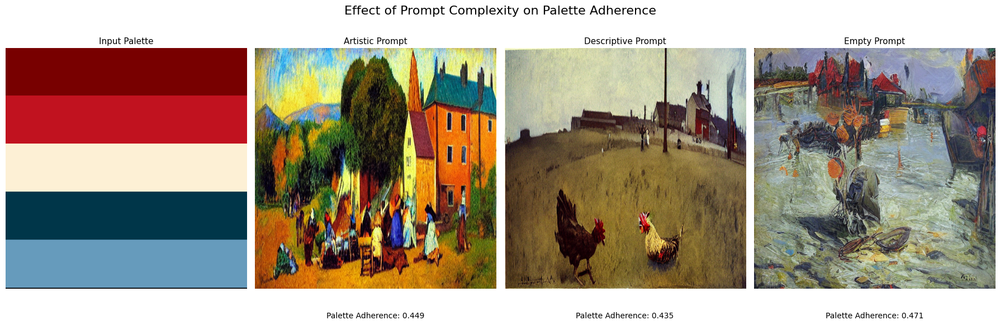

In [60]:
# ==========================================================
# CELL 10: Quantitative Evaluation – Prompt Influence
# ==========================================================
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# ---------- Color Consistency / Palette Adherence Metric ----------
def calculate_palette_adherence(condition_img, generated_img, n_colors=5):
    """
    Measures how well the generated image follows the conditioning palette
    using dominant color matching.
    Returns a relative score in [0, 1] (higher = better adherence).
    """
    from sklearn.cluster import KMeans
    def extract_colors(img):
        arr = np.array(img).reshape(-1, 3)
        if len(arr) > 10000:
            arr = arr[np.random.choice(len(arr), 10000, replace=False)]
        kmeans = KMeans(n_clusters=n_colors, random_state=42, n_init=10)
        kmeans.fit(arr)
        return kmeans.cluster_centers_
    cond_colors = extract_colors(condition_img)
    gen_colors = extract_colors(generated_img)
    # Match generated colors to closest palette colors
    distances = []
    for gc in gen_colors:
        d = min(np.linalg.norm(gc - cc) for cc in cond_colors)
        distances.append(d)
    avg_dist = np.mean(distances)
    # Normalize (empirical, relative metric)
    score = 1.0 - min(avg_dist / 150.0, 1.0)
    return score

# ---------- Prompts ----------
prompts = {
    "Artistic": "masterpiece painting of a village scene, vibrant colors, detailed, trending on artstation",
    "Descriptive": "Painting of a boy holding a rooster, featuring a village",
    "Empty": ""
}

# ---------- Load Conditioning Image ----------
conditioning_image = Image.open(
    "/kaggle/input/color-palettes/Fiery_Ocean.png"
).convert("RGB").resize((512, 512))

# ---------- Run Evaluation ----------
results = {}
print("Running Prompt Influence Evaluation...\n")
for name, prompt in prompts.items():
    img = run_inference(
        prompt=prompt,
        cond_img=conditioning_image,
        scale=2.0,
        steps=40 if prompt != "" else 10,
        cfg=7.5 if prompt != "" else 1.0,
        guess_mode=True 
    )
    score = calculate_palette_adherence(conditioning_image, img)
    results[name] = {
        "image": img,
        "score": score,
        "prompt": prompt
    }
    # Save individual images
    img.save(f"eval_prompt_{name.lower()}.png")
    print(f"{name} Prompt:")
    print(f" Palette Adherence Score: {score:.4f}\n")

# ---------- Visualization ----------
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
# Input palette
axes[0].imshow(conditioning_image)
axes[0].set_title("Input Palette", fontsize=11)
axes[0].axis("off")

# Generated outputs
for i, (name, data) in enumerate(results.items(), start=1):
    axes[i].imshow(data["image"])
    axes[i].set_title(f"{name} Prompt", fontsize=11)
   
    # Put score BELOW the image
    axes[i].text(
        0.5, -0.12,
        f"Palette Adherence: {data['score']:.3f}",
        transform=axes[i].transAxes,
        ha="center",
        fontsize=10
    )
    axes[i].axis("off")

# Main title (higher up)
fig.suptitle(
    "Effect of Prompt Complexity on Palette Adherence",
    fontsize=16,
    y=1.05
)
plt.tight_layout()
plt.savefig("evaluation_prompt_influence.png", dpi=200, bbox_inches="tight")
plt.show()